***Data Mining Arrest Patterns in Chicago***
<br/> *by Chadi Amzil*

**Introduction:**
Chicago's diverse socio-economic landscape presents a complex environment for law enforcement and public safety. Analyzing arrest patterns can offer critical insights into the effectiveness of policing strategies, potential biases in law enforcement, and areas requiring policy reform. This proposal aims to explore [the arrest dataset](https://data.cityofchicago.org/Public-Safety/Arrests/dpt3-jri9/about_data) provided by the Chicago Police Department (CPD) through its Automated Arrest application, part of the CPD CLEAR (Citizen Law Enforcement Analysis and Reporting) system. This dataset, encompassing detailed records of adult arrests, serves as a valuable resource for understanding crime and arrest dynamics within the city.

**Dataset Description and Significance:** The dataset includes comprehensive data on adult arrests made by the CPD, detailing the arrestee's age, race/ethnicity, charges, and the severity and classification of these charges. Each record is uniquely identified by a Central Booking Number, with additional linkage to the criminal incident report via the Records Division Number. This dataset's specification and detail level, especially the inclusion of up to four charges per arrest with detailed charge characteristics, offers a unique opportunity to dissect and analyze arrest patterns across different demographics and charge types. The potential to link these arrest records with broader crime data in Chicago further enhances its significance for a detailed analysis.

**Story to Tell and Importance:** The analysis seeks to uncover trends and patterns within arrest data, focusing on racial disparities, charge severity, and temporal trends. By examining these aspects, the project aims to contribute to discussions on criminal justice reform, policing effectiveness, and the equitable application of law enforcement resources across Chicago's diverse communities. Understanding these dynamics is crucial for policymakers, law enforcement agencies, and community advocates working towards a more just and safe urban environment.

**Deliverables:** By the end of February, this project will produce:

1. Comprehensive Data Analysis Report: Offering an in-depth examination of arrest patterns, including statistical analyses, trend identification, and disparities in charges and outcomes across different demographics.
2. Interactive Data Visualization Dashboard: A tool for stakeholders to explore arrest data, uncover patterns, and derive insights based on specific queries or interests.
3. Executive Summary Presentation: Summarizing key findings, policy implications, and recommendations for law enforcement practices and criminal justice reforms in Chicago.

**Conclusion:** This proposal outlines a structured and impactful approach to analyzing arrest data in Chicago, aiming to reveal insights that support informed decision-making and policy development for enhancing public safety and justice in urban communities. Through diligent analysis and thoughtful interpretation, this project aspires to contribute meaningfully to the ongoing discourse on policing and criminal justice reform.

**Resource and Assistance Requirements:** The project will utilize Python for data analysis, with libraries such as pandas for d``pandas``, ``matplotlib.pyplot``, and possibly machine learning libraries for predictive modeling. Access to the detailed arrest dataset will be secured through a request to the CPD, and any necessary technical support can be sought from course instructors or external experts in data analysis and criminal justice.

**Work Schedule:** The next two weeks will be dedicated to preliminary data exploration and cleaning, followed by an in-depth analysis phase. Regular progress reviews will be scheduled to ensure alignment with project objectives and timely resolution of any technical challenges. A structured approach, alternating between intensive analysis periods and feedback/review sessions, will facilitate efficient progress towards the project deliverables.




In [1]:
!pip install milestone3

In [2]:
!pip install sodapy

In [3]:
import pandas as pd
from milestone3 import leos_tasks
from sodapy import Socrata

# Unauthenticated client only works with public data sets. Note 'None'
# in place of application token, and no username or password:
client = Socrata('data.cityofchicago.org', None)

# First 631,470 results from the dataset identified by 'dpt3-jri9' on the data portal
# The results are returned as JSON from the API and converted to a Python list of dictionaries by sodapy
results = client.get('dpt3-jri9', limit=631470)

# Convert to pandas DataFrame
master_df = pd.DataFrame.from_records(results)


In [4]:
#Create an independent copy of master_df called working_df
working_df = master_df.copy(deep='True')
#Inspect Dataframe
working_df.head()

,cb_no,arrest_date,race,charge_1_statute,charge_1_description,charge_1_class,charge_2_statute,charge_2_description,charge_2_class,charges_statute,...,charge_3_class,charge_4_statute,charge_4_description,charge_4_type,charge_4_class,:@computed_region_rpca_8um6,:@computed_region_vrxf_vc4k,:@computed_region_6mkv_f3dw,:@computed_region_bdys_3d7i,:@computed_region_43wa_7qmu
0,30531020,2025-11-25T00:52:00.000,BLACK,725 ILCS 5.0/110-3,ISSUANCE OF WARRANT,Z,725 ILCS 5.0/110-3,ISSUANCE OF WARRANT,Z,725 ILCS 5.0/110-3 | 725 ILCS 5.0/110-3 | |,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,30531009,2025-11-25T23:23:00.000,WHITE,720 ILCS 5.0/16-25-A-1,RETAIL THEFT/DISP MERCH/<$300/PRECONV,4,725 ILCS 225.0/13,FUGITIVE FROM JUSTICE - OUT OF STATE WARRANT,Z,720 ILCS 5.0/16-25-A-1 | 725 ILCS 225.0/13 | |,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,30531001,2025-11-25T21:33:00.000,BLACK,720 ILCS 5.0/12-3.05-D-4,AGG BATTERY/PEACE OFFICER,2,720 ILCS 5.0/31-1-A,RESISTING/OBSTRUCT/PC OFF/CORR EMP/FRFTR,A,720 ILCS 5.0/12-3.05-D-4 | 720 ILCS 5.0/31-1-A...,...,A,720 ILCS 5.0/31-1-A,RESISTING/OBSTRUCT/PC OFF/CORR EMP/FRFTR,M,A,NaN,NaN,NaN,NaN,NaN
3,30531000,2025-11-25T21:50:00.000,WHITE HISPANIC,625 ILCS 5.0/11-501-A-2,IVC - DRIVING UNDER INFLUENCE OF ALCOHOL,A,625 ILCS 5.0/11-501-A-1,IVC - DRIVING UNDER INFLUENCE OF ALCOHOL BAC 0.08,A,625 ILCS 5.0/11-501-A-2 | 625 ILCS 5.0/11-501-...,...,L,9-8-020(C)(1),DISOBEY RED CIRCULAR STEADY SIGNAL STOP,NaN,L,NaN,NaN,NaN,NaN,NaN
4,30530995,2025-11-25T19:03:00.000,BLACK,430 ILCS 65.0/2-A-2,POSS AMMUNITION - W/O VALID FOID,A,720 ILCS 5.0/12-1-A,ASSAULT - SIMPLE,C,430 ILCS 65.0/2-A-2 | 720 ILCS 5.0/12-1-A | |,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
# Determine the shape of the DataFrame
# Ensure (rows,columns) match expected outcome
working_df.shape

(631470, 29)

After examining the output of ***working_df.shape***, I noticed an unexpected increase in the number of columns within the DataFrame. Originally, the dataset was understood to contain only 24 columns, yet my DataFrame showed a total of 29 columns upon import. This prompted me to investigate the discrepancy further.

Upon closer inspection, I hypothesized that the excess columns were a result of the large dataset size, leading the API to automatically include additional columns. These extra columns appeared to be intended for geographical data, as they were predominantly filled with NaN (null) values.

To address this issue and streamline my DataFrame by removing these unnecessary columns, I executed the following code  below:

In [6]:
# Identify columns starting with ':@computed_region'
computed_columns = [col for col in working_df.columns if col.startswith(':@computed_region')]

# Drop identified columns from the DataFrame
working_df = working_df.drop(columns=computed_columns)

# Output the new shape of the DataFrame
working_df.shape

(631470, 24)

In [7]:
# Calculate and print the sum of null (NA) values in each column of the DataFrame
print(working_df.isnull().sum())

cb_no                        0
arrest_date                  0
race                         0
charge_1_statute             0
charge_1_description         0
charge_1_class            4546
charge_2_statute        345918
charge_2_description    345918
charge_2_class          347380
charges_statute              0
charges_description          0
charges_type                 0
charges_class                0
case_number             236931
charge_1_type           132804
charge_2_type           468264
charge_3_statute        471717
charge_3_description    471717
charge_3_type           575338
charge_3_class          472206
charge_4_statute        542696
charge_4_description    542696
charge_4_type           608353
charge_4_class          542857
dtype: int64


After examining the count of null values across each column in my DataFrame, it became evident that certain columns may not be conducive to effective modeling, visualization, and interpretation. This realization prompted me to consider the removal of specific columns, particularly those prefixed with ***charge_2***, ***charge_3***, and ***charge_4***. These columns not only exhibited a high number of null entries but, based on the City of Chicago's database documentation, the ***charge_1*** column denoted the most severe charge against an individual, which should suffice for the depth of analysis I intend to conduct. Given that charge_1 represents the primary charge, focusing on this data simplifies the analysis without significantly compromising its integrity.

Moreover, I removed all columns that started with ***charges*** since they mainly represented the total charges a person was charged with and their types. Since ***charge_2***, ***charge_3***, and ***charge_4*** were excluded, such information no longer serves a purpose, and I will only need data from ***charge_1*** for my analysis.

Additionally, I opted to exclude the ***charge_1_statute*** column. Although it provides legal codes associated with each charge, these statutes are primarily numeric and legal references that might obscure rather than clarify the analysis for those not versed in legal jargon. The complexity and specificity of these legal codes could detract from the broader understanding and interpretation of the data.

Furthermore, columns such ***as cb_no*** were identified as irrelevant to the analysis's objectives. These identifiers serve administrative or tracking purposes within the dataset but do not offer substantive insights for analytical or modeling endeavors focused on charge patterns or demographic analysis. Removing these columns helps streamline the dataset, ensuring that the analysis remains focused on variables with direct relevance to the study's goals.

In [8]:
# Create a list of columns to be removed, starting with 'charge_4', 'charge_3', and 'charge_2'
remove_columns= [col for col in working_df.columns if col.startswith(('charge_4','charge_3','charge_2'))]
# Append columns starting with 'charges' to the list, as they are no longer needed
remove_columns+= [col for col in working_df.columns if col.startswith('charges')]
# Add additional columns to the list: 'cb_no', 'case_number', and 'charge_1_statute'
remove_columns+= ['cb_no','charge_1_statute']
# Drop the specified columns from the DataFrame to streamline the dataset
working_df = working_df.drop(columns=remove_columns)


In [9]:
# Print the sum of null values for each column in the DataFrame to look at the update null values
print(working_df.isnull().sum())


arrest_date                  0
race                         0
charge_1_description         0
charge_1_class            4546
case_number             236931
charge_1_type           132804
dtype: int64


Since using using ```inplace=True``` modifies the original DataFrame it can potentially lead to confusion and less readable code. Assignments create a new DataFrame, promoting clarity and data integrity. It’s recommended to avoid ```inplace=True``` to maintain code traceability and prevent unexpected behaviors



In [10]:
# Remove all rows with missing values from the DataFrame and update it in place
working_df.dropna(inplace=True)

In [11]:
working_df.shape

(376670, 6)

In [12]:
working_df.describe()

,arrest_date,race,charge_1_description,charge_1_class,case_number,charge_1_type
count,376670,376670,376670,376670,376670,376670
unique,335843,7,1705,13,346430,5
top,2024-04-15T08:50:00.000,BLACK,PCS - POSSESSION - POSS AMT CON SUB EXCEPT (A)(D),A,JG502536,M
freq,40,266984,35174,196333,94,229562


Upon discovering that the predominant arrests within the dataset pertained to individuals identified as “Black” and the prevailing charges were related to controlled substance possession, I was initially taken aback. However, I considered that this trend might be reflective of data spanning several previous years. To gain a current perspective, I decided to conduct a fresh analysis using the `.describe` method on **working_df** specifically for the year 2024, hoping to observe any shifts or improvements in the data trends.


In [13]:
#@title SPOILER

# Clones the GitHub repository containing the SECRET.py file
!git clone https://github.com/camzil/comp306.git

# Imports the hidden function from the SECRET.py file located in the comp306 directory
from comp306.SECRET import hidden

# Imports necessary modules for displaying markdown and creating interactive UI elements
from IPython.display import HTML, display, Markdown
from ipywidgets import Button, Output, Layout

# Creates an output widget to control the display area for the markdown content
out = Output()

# Defines a function that will be triggered when the button is clicked
def on_button_clicked(b):
    with out:
        out.clear_output()  # Clears the previous output to ensure only the latest click's output is shown
        # Execute the hidden function to get the markdown-formatted message
        markdown_text = hidden()  # Ensures that the hidden function returns a markdown-formatted string
        # Display the markdown-formatted text in the output area
        display(Markdown(markdown_text))

# Creates a button widget with a description
button = Button(description="Click for Text", layout=Layout(height='90px', width='150px'))

# Registers the above function as an event handler for button clicks
button.on_click(on_button_clicked)

# Displays the button and the output widget
display(button, out)


Cloning into 'comp306'...
remote: Enumerating objects: 3, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 3 (delta 0), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (3/3), done.


Button(description='Click for Text', layout=Layout(height='90px', width='150px'), style=ButtonStyle())

Output()

In [14]:
# Filter the DataFrame for rows where 'arrest_date' begins with '2024'
working_df_2024 = working_df[working_df['arrest_date'].astype(str).str.startswith("2024")]

# Generate descriptive statistics for the filtered DataFrame
working_df_2024.describe()

,arrest_date,race,charge_1_description,charge_1_class,case_number,charge_1_type
count,32987,32987,32987,32987,32987,32987
unique,30362,7,707,10,30721,2
top,2024-04-15T08:50:00.000,BLACK,DOMESTIC BATTERY/BODILY HARM,A,JH250367,M
freq,40,20932,2591,17783,66,20128


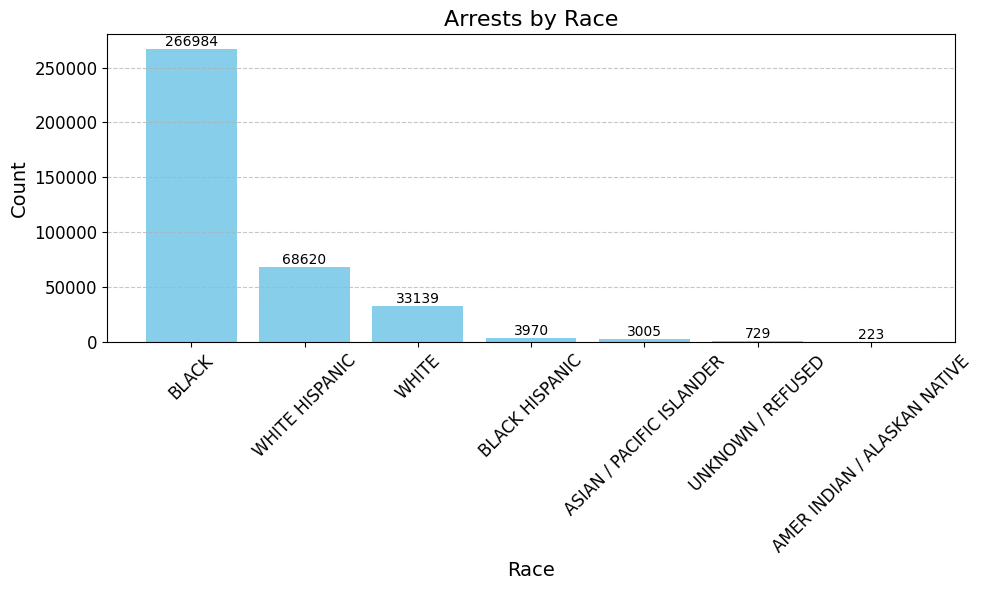

In [15]:
import matplotlib.pyplot as plt
# Count the occurrences of each unique value in the 'race' column of working_df and store the result
arrests_by_race = working_df['race'].value_counts()

# Set the size of the figure (width, height) for the plot
plt.figure(figsize=(10, 6))

# Create a bar chart with the index of arrests_by_race as the x-values and the corresponding values as the y-values, set the bar color to sky blue
bars = plt.bar(arrests_by_race.index, arrests_by_race.values, color='skyblue')

# Set the title of the plot with a font size of 16
plt.title('Arrests by Race', fontsize=16)

# Set the label for the x-axis with a font size of 14
plt.xlabel('Race', fontsize=14)

# Set the label for the y-axis with a font size of 14
plt.ylabel('Count', fontsize=14)

# Rotate the x-axis labels by 45 degrees and set the font size to 12 for better readability
plt.xticks(rotation=45, fontsize=12)

# Set the font size of the y-axis labels to 12
plt.yticks(fontsize=12)

# Add grid lines along the y-axis with a dashed line style and 70% opacity for better readability of the plot
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Loop through each bar in the bar chart
for bar in bars:
    # Get the height of the bar, which represents the value/count
    yval = bar.get_height()
    # Place a text label on top of the bar with the value, centered horizontally and just above the bar, with a font size of 10
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom', fontsize=10)

# Adjust the layout of the plot to ensure that labels and titles are not cut off when displayed
plt.tight_layout()

# Display the plot
plt.show()

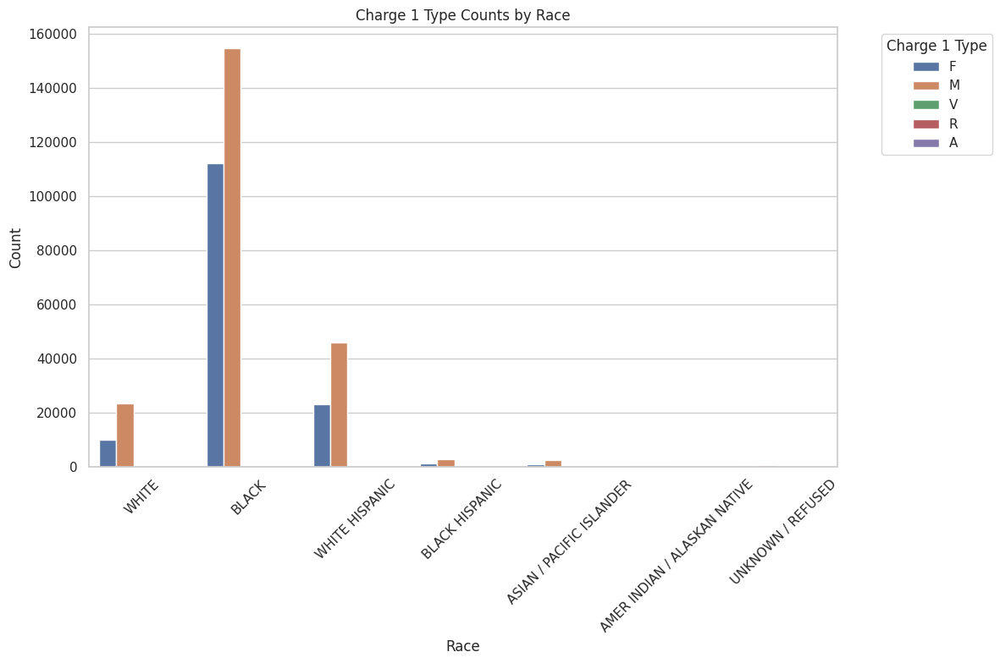

In [16]:
import seaborn as sns
sns.set(style="whitegrid")

# Set up the plot
plt.figure(figsize=(12, 8))

# Create the bar plot
sns.countplot(data=working_df, x='race', hue='charge_1_type')

# Add title and labels
# M Represents Misdemeanor, F represents Felony
plt.title('Charge 1 Type Counts by Race')
plt.xlabel('Race')
plt.ylabel('Count')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.legend(title='Charge 1 Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


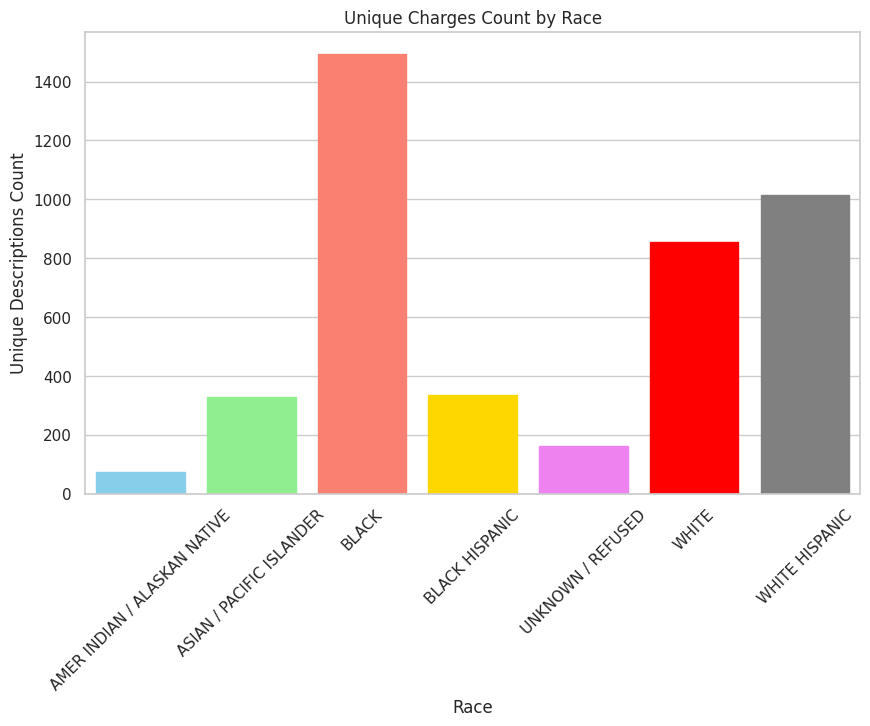

In [17]:

# Count unique 'charge_1_description' for each 'race'
agg_desc = working_df.groupby('race')['charge_1_description'].nunique().reset_index()

# Rename columns for clarity if necessary
agg_desc.columns = ['race', 'unique_charge_counts']


# Define a list of colors. Adjust the number of colors to match the number of unique races in your DataFrame.
colors = ['skyblue', 'lightgreen', 'salmon', 'gold', 'violet', 'red','grey']

# Plotting
plt.figure(figsize=(10, 6))

# Create the barplot and manually assign colors to each bar
barplot = sns.barplot(data= agg_desc, x='race', y='unique_charge_counts')

# Set colors for each bar manually
for i, bar in enumerate(barplot.patches):
    bar.set_color(colors[i % len(colors)])  # Use modulo to cycle through colors if there are more bars than colors

plt.title('Unique Charges Count by Race')
plt.xlabel('Race')
plt.ylabel('Unique Descriptions Count')
plt.xticks(rotation=45)

plt.show()


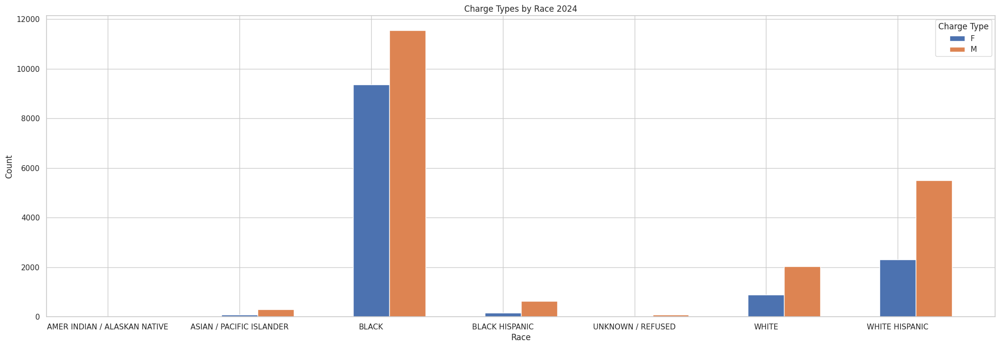

In [18]:
# Group the DataFrame by 'race' and 'charge_1_type', count the occurrences, and reshape the data using unstack, filling missing values with 0
agg_data = working_df_2024.groupby(['race', 'charge_1_type']).size().unstack(fill_value=0)

# Begin plotting a grouped bar chart with a specified figure size
fig, ax = plt.subplots(figsize=(25, 8))
width = 0.55  # Set the width of the bars in the bar chart

# Calculate the number of bar groups and create a range of indices for bar placement
n = len(agg_data.columns)
indices = range(len(agg_data))

# Loop through each charge type and plot the bars at calculated positions
for i, column in enumerate(agg_data.columns):
    ax.bar([index + (width/n)*i for index in indices], agg_data[column], width/n, label=column)

# Set the title, labels for the axes, and customize the x-ticks for better readability
ax.set_title('Charge Types by Race 2024')
ax.set_xlabel('Race')
ax.set_ylabel('Count')
ax.set_xticks(indices)
ax.set_xticklabels(agg_data.index)

# Add a legend to the chart with a title to identify different charge types
ax.legend(title='Charge Type')

# Display the plot
plt.show()


# **Executive Summary**

*The analysis of [arrest records](https://data.cityofchicago.org/Public-Safety/Arrests/dpt3-jri9/about_data), underscores the persistently disproportionate rates at which individuals identified as Black are arrested, with Black individuals experiencing more than four times as many arrests as any other racial group.  This disparity is even more pronounced when examining the types of charges, revealing that Black individuals have the highest incidences of both Misdemeanor and Felony arrests. Specifically, Black individuals represent 350,335 out of a total of 495,467 arrests in the database, equating to approximately 71% of the total arrests. This pattern not only points to systemic issues within law enforcement practices but also underscores the complexity of the socio-economic and legal factors contributing to these disparities.*

The persistently disproportionate arrest rates of Black individuals, alongside an exploration of the nature of these arrests, yield critical insights:

**Charge Distribution:** The data indicates that Black individuals are not only arrested more frequently but also face a broader spectrum of charges. This pattern suggests a systemic inclination toward more aggressive policing strategies within Black communities, potentially reflecting biases in law enforcement practices.

**Temporal Trends:** A thorough examination of arrest data extending through 2024 reveals that these disparities have not only persisted over time but, in some instances, have worsened. The enduring nature of these trends emphasizes the systemic issues at play, suggesting that previous efforts to address these imbalances have been insufficient or ineffective.

Despite examining records from as recently as 2024, it is evident that Black identifying individuals still constitute the majority of arrests. This continuity raises serious concerns about the progress (or lack thereof) in combating racial disparities within the justice system.

### **Possible Hypotheses**

Several hypotheses can be proposed to explain why these disparities persist:

1. **Socio-Economic Factors:** Disparities in arrest rates may be influenced by underlying socio-economic conditions, including poverty, unemployment, and limited access to quality education, disproportionately affecting Black communities. These conditions can increase the likelihood of engagement in activities that lead to arrests.

2. **Systemic Bias and Policing Practices:** There may be inherent biases within law enforcement and judicial systems that lead to disproportionately aggressive policing in Black communities, including racial profiling and targeting.

3. **Legislative and Policy Issues:** Laws and policies that disproportionately criminalize behaviors more prevalent in economically disadvantaged communities can lead to higher arrest rates among Black individuals.

### **Recommendations for Action**
To address these disparities and move toward a more equitable justice system, the following actions are recommended:

1. **Reform Policing Practices:** Implement comprehensive police reform that includes bias training, community policing initiatives, and accountability measures for misconduct. Encourage practices that build trust between law enforcement and the communities they serve.

2. **Address Socio-Economic Disparities:** Invest in programs aimed at improving the socio-economic conditions of Black communities. Focus on education, employment opportunities, healthcare access, and affordable housing to address the root causes of crime.

3. **Review and Revise Legislation:** Examine laws and policies for inherent biases that may disproportionately affect Black individuals. Work toward reforming such legislation to ensure fairness and equity in the application of the law.

4. **Enhance Data Transparency and Research:** Continue to monitor and publicly report arrest data by race to ensure ongoing accountability. Support research into the causes of racial disparities in the justice system and the effectiveness of interventions.

5. **Community Engagement and Empowerment:** Foster stronger relationships between law enforcement agencies and Black communities through regular dialogue, collaboration on public safety strategies, and empowerment initiatives that give communities a voice in how they are policed.

# **Milestone 4 COMP 306**
**Overview:**
In Milestone 4 of my research project, I am focusing on expanding and deepening my analysis of arrest patterns within Chicago by incorporating a new dataset, the crimes dataset, alongside my existing arrest dataset. Both datasets are linked by a common field, "case_number," which facilitates their integration. This milestone aims to enhance my understanding of the spatial dynamics of arrests and crimes, potentially strengthening my hypotheses about racial disparities and the effectiveness of law enforcement practices.

**Integration of Datasets:**
My primary task in this milestone involves merging the arrest dataset with the crimes dataset. The additional location coordinates provided in the crimes dataset are crucial, as they allow me to conduct a geographical analysis of crime and arrest patterns. This spatial component is vital in understanding how location influences or correlates with arrest rates, particularly across different racial groups and types of offenses.

**Key Analysis Objectives:**

1. Spatial Analysis: I will utilize the location data to map arrest patterns and compare them with crime occurrences. This analysis can reveal whether certain areas are disproportionately targeted by police actions and whether this targeting correlates with the racial demographics of those areas.
2. Temporal and Demographic Trends: I will further analyze how arrest and crime patterns have evolved over time, with a continued focus on racial disparities. This includes assessing whether any changes in policing strategies or community demographics have influenced these trends.
**Potential Enhancements to Hypotheses:**
The integration of the crimes dataset allows for a more nuanced understanding of the context in which arrests occur, potentially affecting my existing hypotheses:
1. Socio-Economic Contextualization: Enhanced by location data, I can examine how socio-economic factors tied to specific areas influence crime and arrest rates.
2. Systemic Bias Exploration: With a clearer picture of where arrests are occurring relative to crimes reported, I can better assess claims of systemic bias and targeting by law enforcement.
**Expected Outcomes and Impact:**
This milestone is expected to yield a multi-dimensional view of how and where arrests occur, providing a richer context for discussing racial disparities in law enforcement. The findings could be pivotal for:

**Policy Recommendations:** Offering evidence-based guidance on policing reforms, socio-economic interventions, and legislative adjustments.
**Community Engagement:** Informing strategies for building trust and cooperation between law enforcement and communities, particularly in areas with high arrest rates.
<br>
<br>
**Summary:**
Milestone 4 promises to be a significant step forward in my research, offering the potential to clarify and expand upon the initial findings regarding racial disparities in arrest patterns. By integrating and analyzing geographical data alongside arrest records, my project aims to provide more comprehensive insights into the dynamics of law enforcement in Chicago, supporting efforts towards more equitable and effective policing.

In [20]:
from sodapy import Socrata

# Unauthenticated client only works with public data sets. Note 'None'
# in place of application token, and no username or password:
client = Socrata('data.cityofchicago.org', None)
# Manual timeout - was experiencing errors with the standard 10 sec timeout
client.timeout = 20

# First 631,470 results from the dataset identified by 'dpt3-jri9' on the data portal
# The results are returned as JSON from the API and converted to a Python list of dictionaries by sodapy
results = client.get('ijzp-q8t2', limit=631470)

# Convert to pandas DataFrame
master_df2 = pd.DataFrame.from_records(results)


In [21]:
#Create an independent copy of master_df called working_df2
working_df2 = master_df2.copy(deep='True')
#Inspect Dataframe
working_df2.head()

,id,case_number,date,block,iucr,primary_type,description,location_description,arrest,domestic,...,location,:@computed_region_awaf_s7ux,:@computed_region_6mkv_f3dw,:@computed_region_vrxf_vc4k,:@computed_region_bdys_3d7i,:@computed_region_43wa_7qmu,:@computed_region_rpca_8um6,:@computed_region_d9mm_jgwp,:@computed_region_d3ds_rm58,:@computed_region_8hcu_yrd4
0,14035676,JJ497470,2025-11-21T00:00:00.000,055XX S WESTERN AVE,0460,BATTERY,SIMPLE,STREET,False,False,...,"{'latitude': '41.793141605', 'longitude': '-87...",19,22248,61,112,3,58,13,269,15
1,14035544,JJ497277,2025-11-21T00:00:00.000,075XX S STONY ISLAND AVE,143A,WEAPONS VIOLATION,UNLAWFUL POSSESSION - HANDGUN,HOSPITAL BUILDING / GROUNDS,True,False,...,"{'latitude': '41.757630995', 'longitude': '-87...",9,22538,39,188,35,24,19,224,10
2,14035279,JJ497024,2025-11-21T00:00:00.000,005XX N WELLS ST,0810,THEFT,OVER $500,VEHICLE NON-COMMERCIAL,False,False,...,"{'latitude': '41.89112033', 'longitude': '-87....",22,4446,37,652,36,55,14,73,42
3,14037576,JJ500069,2025-11-21T00:00:00.000,019XX W ERIE ST,5001,OTHER OFFENSE,OTHER CRIME INVOLVING PROPERTY,RESIDENCE,False,False,...,"{'latitude': '41.893200189', 'longitude': '-87...",24,21560,25,519,41,4,15,80,36
4,14040656,JJ502379,2025-11-21T00:00:00.000,063XX N SHERIDAN RD,1220,DECEPTIVE PRACTICE,THEFT OF LOST / MISLAID PROPERTY,APARTMENT,False,False,...,"{'latitude': '41.996866019', 'longitude': '-87...",3,4451,76,212,16,14,11,50,48


In [22]:
# Determine the shape of the DataFrame
# Ensure (rows,columns) match expected outcome
working_df2.shape

(631470, 31)

After examining the output of ***working_df2.shape***, I noticed an unexpected increase in the number of columns within the DataFrame. Originally, the dataset was understood to contain only 22 columns, yet my DataFrame showed a total of 31 columns upon import. Since I had this problem with my milestone 3 dataset, I decided to review the `.head` output of ***working_df2***. After closer inspection it appeard that it was in fact the same issue as the arrest dataset - *there were additional columns named `@computed_region` which caused the increase*

In [23]:
# Identify columns starting with ':@computed_region'
computed_columns = [col for col in working_df2.columns if col.startswith(':@computed_region')]

# Drop identified columns from the DataFrame
working_df2 = working_df2.drop(columns=computed_columns)

# Output the new shape of the DataFrame
working_df2.shape

(631470, 22)

In [24]:
# Calculate and print the sum of null (NA) values in each column of the DataFrame
print(working_df2.isnull().sum())

id                         0
case_number                0
date                       0
block                      0
iucr                       0
primary_type               0
description                0
location_description    2810
arrest                     0
domestic                   0
beat                       0
district                   0
ward                       3
community_area             1
fbi_code                   0
x_coordinate            2488
y_coordinate            2488
year                       0
updated_on                 0
latitude                2488
longitude               2488
location                2488
dtype: int64


In the process of refining my dataset for a more focused analysis of crime patterns in Chicago, I made the strategic decision to remove several columns that were either not relevant to my research goals or that could potentially obscure the insights I was aiming to uncover. This pruning of the dataset was guided by the desire to streamline the analysis and enhance the clarity and relevance of the findings.

1. **Identifiers and High-Granularity Location Data:** I removed columns such as *id, block, district, ward, beat, and community_area*. These fields, while useful for detailed geographic tracking, provide a level of specificity that is not necessary for my analysis. My research does not focus on micro-geographic trends but rather on broader spatial dynamics across the city. Reducing geographic detail helps in maintaining the privacy of the data and avoids the complexities associated with hyper-local analyses, which are not within the scope of my study.

2. **Detailed Incident Descriptors**: Columns like *iucr, description, and location_description* offer in-depth details about each crime incident. While informative, these descriptors introduce a high level of variance and specificity that could detract from the generalizability of my findings. My goal is to observe overarching patterns rather than the specifics of individual cases, making these detailed descriptors unnecessary.

3. **Miscellaneous Information**: I also removed columns like *fbi_code, x_coordinate, y_coordinate, and updated_on*. The fbi_code is redundant in the context of my analysis, which does not require classification of crime types based on FBI categorizations. The update timestamps, while potentially useful for re tracking changes in data reporting, do not align with the static, historical analysis I am conducting. The x_coordinate and y_coordinate were redundant since the dataset also includes latitude and longitude fields. Upon careful review, I determined that the latitude and longitude fields are sufficient for all geospatial analyses required for my research.

By removing these columns, I have effectively tailored the dataset to better fit the analytical framework of my project, ensuring that each remaining element of the data contributes directly to understanding the spatial dynamics of crime in Chicago. This focused approach not only simplifies the data handling and processing tasks but also sharpens the analytical lens through which I examine urban crime patterns, enhancing the potential impact and relevance of my research outcomes.




In [25]:
# Create a list of columns to be removed
remove_columns= ['id','block','iucr','description','location_description','arrest']
remove_columns+=['domestic','beat','district','ward','community_area','fbi_code', 'x_coordinate', 'y_coordinate','updated_on']
# Drop the specified columns from the DataFrame to streamline the dataset
working_df2 = working_df2.drop(columns=remove_columns)

In [26]:
# Print the sum of null values for each column in the DataFrame to look at the updated null values
print(working_df2.isnull().sum())

case_number        0
date               0
primary_type       0
year               0
latitude        2488
longitude       2488
location        2488
dtype: int64


In [27]:
# Remove all rows with missing values from the DataFrame and update it in place
working_df2.dropna(inplace=True)

In [28]:
#Set 'case_number' as the index of working_df without dropping it from the DataFrame
working_df.set_index('case_number', inplace=True, drop= False)
# Set 'case_number' as the index of working_df2. Unlike the first DataFrame, drop the column from working_df2
working_df2.set_index('case_number', inplace=True)

In [29]:
# Perform an inner join on working_df and working_df2 using their indices (case_number)
# This will give you only the cases where an arrest was made for a crime
joined_df = working_df.join(working_df2, how='inner')

In [30]:
#Making sure that the new joined dataset doesn't have any null values
print(joined_df.isnull().sum())

arrest_date             0
race                    0
charge_1_description    0
charge_1_class          0
case_number             0
charge_1_type           0
date                    0
primary_type            0
year                    0
latitude                0
longitude               0
location                0
dtype: int64


In [31]:
#Inspecting the size of my dataset
joined_df.shape

(77388, 12)

In [32]:
#Inspect Dataframe
joined_df.head()

,arrest_date,race,charge_1_description,charge_1_class,case_number,charge_1_type,date,primary_type,year,latitude,longitude,location
case_number,,,,,,,,,,,,
JJ454312,2025-11-25T12:22:00.000,BLACK,AGGRAVATED BATTERY/STRANGLE,3,JJ454312,F,2025-10-16T18:55:00.000,CRIMINAL SEXUAL ASSAULT,2025,41.74327238,-87.586908167,"{'latitude': '41.74327238', 'longitude': '-87...."
JJ404146,2025-11-25T12:30:00.000,BLACK,MURDER - FIRST DEGREE,M,JJ404146,F,2025-09-06T11:10:00.000,HOMICIDE,2025,41.725745603,-87.632403887,"{'latitude': '41.725745603', 'longitude': '-87..."
JJ476594,2025-11-25T08:05:00.000,BLACK,DOMESTIC BATTERY - AGGRAVATED,2,JJ476594,F,2025-11-04T02:15:00.000,BATTERY,2025,41.881828448,-87.744145635,"{'latitude': '41.881828448', 'longitude': '-87..."
JJ461752,2025-11-24T13:37:00.000,BLACK,AGGR DISCHARGE FIREARM - OCCUPIED VEHICLE,1,JJ461752,F,2025-10-22T22:21:00.000,BATTERY,2025,41.894925002,-87.756234153,"{'latitude': '41.894925002', 'longitude': '-87..."
JJ310878,2025-11-24T11:36:00.000,BLACK,FORGERY - ISSUE/DELIVER DOCUMENT,3,JJ310878,F,2025-06-23T11:23:00.000,DECEPTIVE PRACTICE,2025,41.894496091,-87.745792225,"{'latitude': '41.894496091', 'longitude': '-87..."


To ensure the integrity of my dataset following the inner join and merging processes, I decided to create a graphical plot focusing on racial demographics. This step was crucial to verify that the merging of the arrest and crime datasets did not inadvertently alter the racial composition of the data. By visually representing the racial distribution both before and after the merge, I could effectively assess and confirm that the join operation preserved the proportional representation of different racial groups. This validation is essential, as maintaining an accurate racial profile is critical for my analysis of disparities in law enforcement practices across different communities.

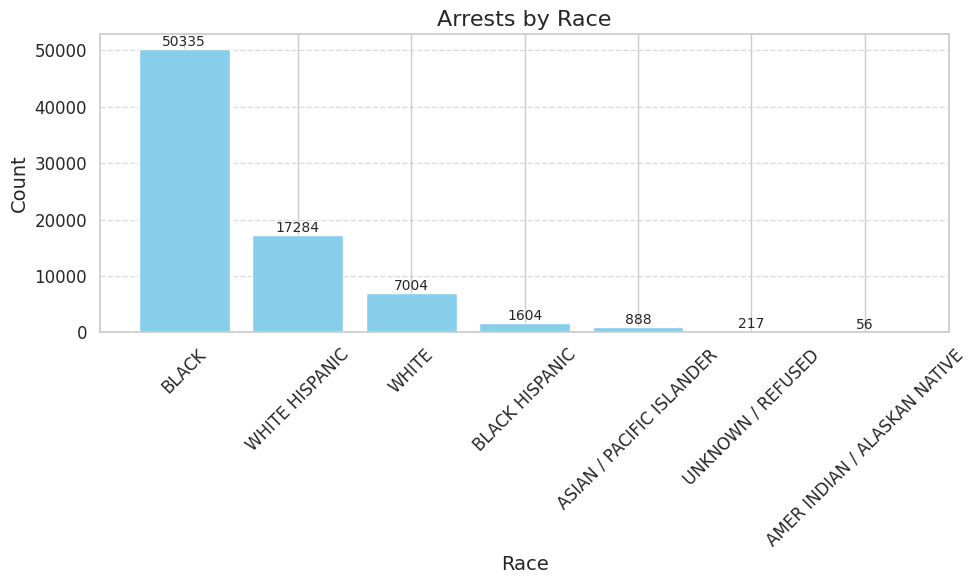

In [33]:
# Count the occurrences of each unique value in the 'race' column of working_df and store the result
arrests_by_race = joined_df['race'].value_counts()

# Set the size of the figure (width, height) for the plot
plt.figure(figsize=(10, 6))

# Create a bar chart with the index of arrests_by_race as the x-values and the corresponding values as the y-values, set the bar color to sky blue
bars = plt.bar(arrests_by_race.index, arrests_by_race.values, color='skyblue')

# Set the title of the plot with a font size of 16
plt.title('Arrests by Race', fontsize=16)

# Set the label for the x-axis with a font size of 14
plt.xlabel('Race', fontsize=14)

# Set the label for the y-axis with a font size of 14
plt.ylabel('Count', fontsize=14)

# Rotate the x-axis labels by 45 degrees and set the font size to 12 for better readability
plt.xticks(rotation=45, fontsize=12)

# Set the font size of the y-axis labels to 12
plt.yticks(fontsize=12)

# Add grid lines along the y-axis with a dashed line style and 70% opacity for better readability of the plot
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Loop through each bar in the bar chart
for bar in bars:
    # Get the height of the bar, which represents the value/count
    yval = bar.get_height()
    # Place a text label on top of the bar with the value, centered horizontally and just above the bar, with a font size of 10
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom', fontsize=10)

# Adjust the layout of the plot to ensure that labels and titles are not cut off when displayed
plt.tight_layout()

# Display the plot
plt.show()

In [34]:
#Inspecting the different type
joined_df.dtypes

,0
arrest_date,object
race,object
charge_1_description,object
charge_1_class,object
case_number,object
charge_1_type,object
date,object
primary_type,object
year,object
latitude,object


In [35]:
#Changing latitude and longitude to numeric/ float values, to avoid errors or issues when mapping the data
joined_df['latitude'] = pd.to_numeric(joined_df['latitude'])
joined_df['longitude'] = pd.to_numeric(joined_df['longitude'])
#Inspecting the Dataframe to ensure the change didn't impact the data
joined_df.head()

,arrest_date,race,charge_1_description,charge_1_class,case_number,charge_1_type,date,primary_type,year,latitude,longitude,location
case_number,,,,,,,,,,,,
JJ454312,2025-11-25T12:22:00.000,BLACK,AGGRAVATED BATTERY/STRANGLE,3,JJ454312,F,2025-10-16T18:55:00.000,CRIMINAL SEXUAL ASSAULT,2025,41.743272,-87.586908,"{'latitude': '41.74327238', 'longitude': '-87...."
JJ404146,2025-11-25T12:30:00.000,BLACK,MURDER - FIRST DEGREE,M,JJ404146,F,2025-09-06T11:10:00.000,HOMICIDE,2025,41.725746,-87.632404,"{'latitude': '41.725745603', 'longitude': '-87..."
JJ476594,2025-11-25T08:05:00.000,BLACK,DOMESTIC BATTERY - AGGRAVATED,2,JJ476594,F,2025-11-04T02:15:00.000,BATTERY,2025,41.881828,-87.744146,"{'latitude': '41.881828448', 'longitude': '-87..."
JJ461752,2025-11-24T13:37:00.000,BLACK,AGGR DISCHARGE FIREARM - OCCUPIED VEHICLE,1,JJ461752,F,2025-10-22T22:21:00.000,BATTERY,2025,41.894925,-87.756234,"{'latitude': '41.894925002', 'longitude': '-87..."
JJ310878,2025-11-24T11:36:00.000,BLACK,FORGERY - ISSUE/DELIVER DOCUMENT,3,JJ310878,F,2025-06-23T11:23:00.000,DECEPTIVE PRACTICE,2025,41.894496,-87.745792,"{'latitude': '41.894496091', 'longitude': '-87..."


Given that each record in my dataset represents an incident with both a crime and arrest, my analysis will not differentiate between the two. Instead, I will focus on the aggregate number of incidents recorded annually. This approach will provide a broad overview of criminal activity and law enforcement actions in Chicago, offering insights into whether these incidents are increasing, decreasing, or remaining stable through the years. I will exclude 2024 from this plot as it might give innacurate representation since the year is not fully over yet.

By examining these trends, I aim to pinpoint any significant changes or consistent patterns that might suggest shifts in policy effectiveness, societal behavior, or law enforcement efficiency. This analysis is crucial as it will inform future strategies and policies to enhance public safety and justice in Chicago.

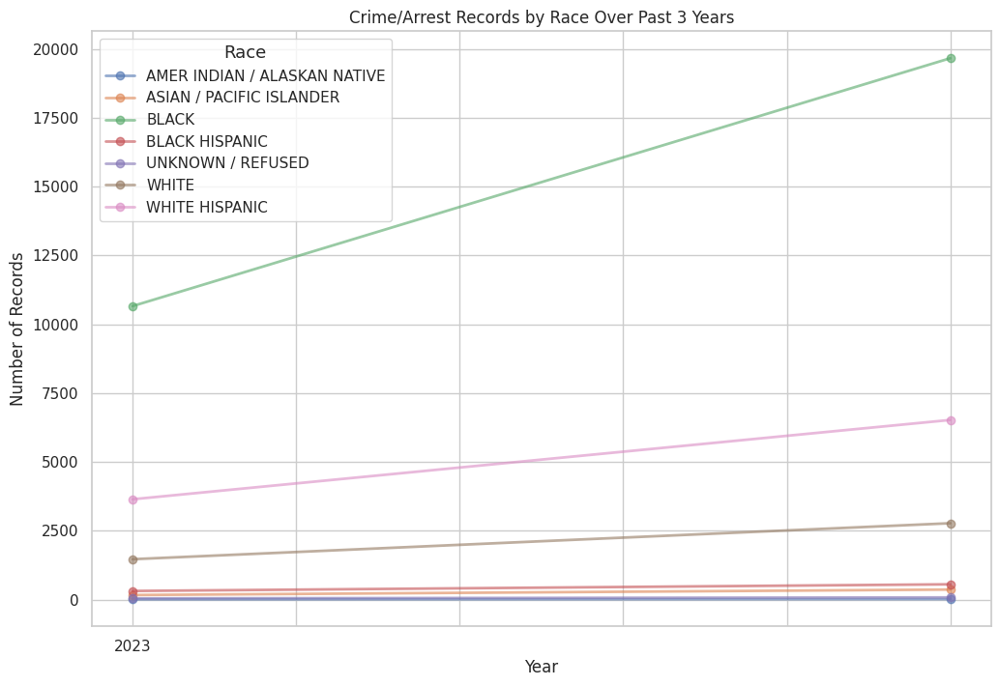

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
# Since years are defind as object in the dataset we will be excludi
previousyears_df = joined_df[joined_df['year'] != '2024']

# Create a pivot table to calculate the number of records per year for each race
# Here we count the occurrences of each crime type
pivot_table = previousyears_df.pivot_table(index='year', columns='race', values='primary_type',
                                    aggfunc='count', fill_value=0)

# Plotting the results
fig, ax = plt.subplots(figsize=(12, 8))
pivot_table.plot(ax=ax, marker='o', linestyle='-', linewidth=2, alpha=0.6)
plt.title('Crime/Arrest Records by Race Over Past 3 Years')
plt.xlabel('Year')
plt.ylabel('Number of Records')
plt.legend(title='Race', title_fontsize='13', fontsize='11', loc='upper left')
plt.grid(True)
plt.show()

In [37]:
#Installing folium library, to import create an interactive map
!pip install folium
# Import the display function to show outputs
from IPython.display import display
# Import folium for map generation and manipulation.
import folium
# Import geopy for calculating geographical distances.
import geopy.distance

In [38]:
# Calculating the mean of latitude values to establish a central point for setting the initial zoom level on the interactive map.
joined_df['latitude'].mean()

np.float64(41.84672635194709)

In [39]:
# Calculating the mean of latitude values to establish a central point for setting the initial zoom level on the interactive map.
joined_df['longitude'].mean()

np.float64(-87.67182671986559)

In [40]:
# Filter the dataset to include only records where the race is identified as 'BLACK'.
# This subset will be used to specifically analyze crime locations and patterns within this demographic,
# which is significant due to their higher incidence in the records.
filtered_df = joined_df[joined_df['race'] == 'BLACK']
#Inspecting Dataframe
filtered_df.head()

,arrest_date,race,charge_1_description,charge_1_class,case_number,charge_1_type,date,primary_type,year,latitude,longitude,location
case_number,,,,,,,,,,,,
JJ454312,2025-11-25T12:22:00.000,BLACK,AGGRAVATED BATTERY/STRANGLE,3,JJ454312,F,2025-10-16T18:55:00.000,CRIMINAL SEXUAL ASSAULT,2025,41.743272,-87.586908,"{'latitude': '41.74327238', 'longitude': '-87...."
JJ404146,2025-11-25T12:30:00.000,BLACK,MURDER - FIRST DEGREE,M,JJ404146,F,2025-09-06T11:10:00.000,HOMICIDE,2025,41.725746,-87.632404,"{'latitude': '41.725745603', 'longitude': '-87..."
JJ476594,2025-11-25T08:05:00.000,BLACK,DOMESTIC BATTERY - AGGRAVATED,2,JJ476594,F,2025-11-04T02:15:00.000,BATTERY,2025,41.881828,-87.744146,"{'latitude': '41.881828448', 'longitude': '-87..."
JJ461752,2025-11-24T13:37:00.000,BLACK,AGGR DISCHARGE FIREARM - OCCUPIED VEHICLE,1,JJ461752,F,2025-10-22T22:21:00.000,BATTERY,2025,41.894925,-87.756234,"{'latitude': '41.894925002', 'longitude': '-87..."
JJ310878,2025-11-24T11:36:00.000,BLACK,FORGERY - ISSUE/DELIVER DOCUMENT,3,JJ310878,F,2025-06-23T11:23:00.000,DECEPTIVE PRACTICE,2025,41.894496,-87.745792,"{'latitude': '41.894496091', 'longitude': '-87..."


In [41]:
import folium
# Import MarkerCluster for grouping close markers.
from folium.plugins import MarkerCluster
# Initialize a folium map centered at given latitude and longitude.
display=folium.Map(location=[41.83080, -87.66247])
# Convert latitude and longitude data into a list for mapping.
coords= filtered_df[['latitude', 'longitude']].values.tolist()
# Add the coordinates to the map as a cluster of markers.
MarkerCluster(coords).add_to(display)
# Display the map
display


# **Project Summary:**
 ## **Key Findings:**
1. **Spatial Distribution of Crimes:** Through mapping and spatial analysis, the project reveals distinct geographical patterns in crime occurrences within individuals identifying as 'Black', with certain areas, particularly the south side of Chicago and some suburbs, experiencing higher crime rates.

2. **Community Dynamics and Policing Practices:** The presence of strong community ties and community-based organizations influences crime rates, which explains why Downtown didn't have as much crimes as the suburban areas or the south of Chicago despite being a heavily populated area, this highlights the importance of community engagement and empowerment in crime prevention efforts. Additionally, disparities in policing practices, including over-policing and under-policing in certain neighborhoods, contribute to racial disparities in arrests.

3. **Socioeconomic Context:** Socioeconomic factors emerge as key determinants of crime patterns, with areas facing higher levels of poverty, unemployment, and social deprivation exhibiting elevated crime rates. Historical legacies of segregation and disparities in access to resources further exacerbate these disparities.

4. **Racial Disparities:** Analysis of crime data by race highlights significant disparities in arrest rates, with individuals of the Black demographic group disproportionately represented in arrest records. This disparity raises important questions about equity and fairness in law enforcement practices.

## **Implications and Recommendations:**

1. Policy Interventions: Evidence-based policy interventions are needed to address the underlying socioeconomic factors driving crime disparities, including targeted investments in education, employment, and community development initiatives.

2. Police Reform: Reforms in policing practices are essential to ensure fairness, accountability, and transparency in law enforcement. This includes addressing biases in policing, enhancing community policing efforts, and promoting diversity and cultural competency within law enforcement agencies.

3. Community Empowerment: Strengthening community engagement and empowerment initiatives can foster trust and cooperation between law enforcement agencies and communities, ultimately contributing to safer and more resilient neighborhoods.

## **Conclusion:**
In conclusion, this project sheds light on the complex interplay of factors shaping crime patterns and racial disparities in Chicago. By providing a comprehensive understanding of these dynamics, the project offers valuable insights for policymakers, law enforcement agencies, and community stakeholders to develop targeted interventions and strategies aimed at promoting equity, justice, and community well-being.



# **Milestone 5**
*by Chadi Amzil*

## **Analyzing Arrest Patterns in Chicago: Insights from a Computer Science Student**

Diving into the complex realm of public safety data in Chicago has been one of the most challenging yet rewarding parts of my journey as a computer science student. When I first came across the detailed arrest dataset provided by the Chicago Police Department, it was not just the volume of data that struck me, but the stories it hinted at beneath the numbers. This project is more than an academic exercise; it's a window into the interactions between law enforcement and the communities they serve.

**Why This Dataset Matters**:

The dataset from the CPD's Automated Arrest system is a treasure trove of information, documenting everything from the demographics of those arrested to the specifics of the charges against them. As a student passionate about the power of data, I was drawn to this dataset for its potential to reveal patterns that could inform public debates and policy decisions. The detailed breakdown of arrests by race, age, and charge type is particularly crucial for understanding how different communities experience policing.

**What the Data Shows**

One of the most alarming findings from my analysis was the disproportionate frequency of arrests among Black individuals compared to other racial groups. This pattern raises significant concerns about racial bias and the fairness of law enforcement practices. The data revealed that Black individuals were not only arrested more often but also faced a broader range of charges. Such disparities pose serious questions about equality under the law and the social factors contributing to these trends.
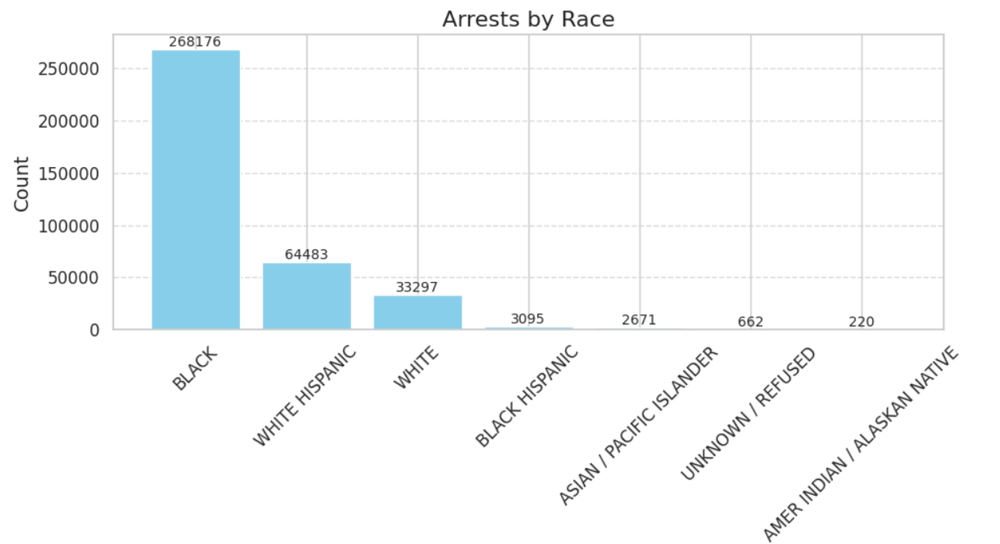

**Delving Deeper: Understanding the Disparities**

As I dissected the data, several hypotheses emerged about why these racial disparities exist:

1. Socio-Economic Influences: It's clear that socio-economic status plays a significant role in crime and arrest rates. Neighborhoods struggling with poverty, unemployment, and educational barriers often see higher levels of police interaction. These conditions can set the stage for more frequent arrests, creating a cycle of disadvantage that is hard to break.
2. Systemic Bias in Policing: The data suggests potential biases in policing strategies. This could be a reflection of subconscious prejudices or systemic structures that disproportionately affect Black communities. Such biases may manifest in more frequent patrols in certain neighborhoods or harsher enforcement of certain types of crimes.
3. Impact of Legislation: Some laws may inadvertently target behaviors more prevalent in specific communities, leading to skewed arrest statistics. This aspect of the legal system requires critical examination to ensure that laws are applied equitably across all groups.
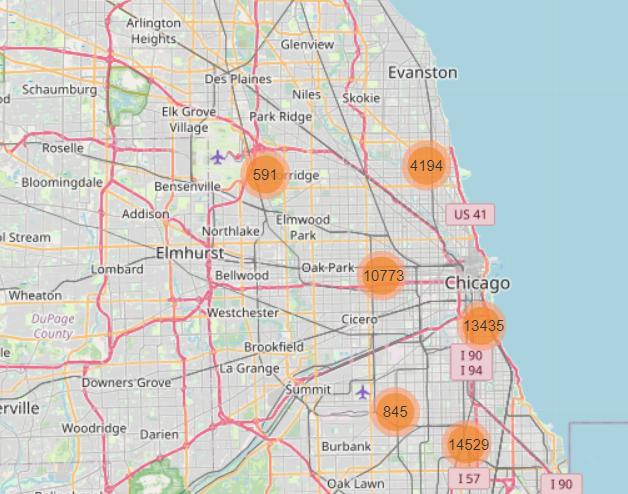

**Implications of Findings**
The implications of these findings are profound. They suggest that without intervention, the cycle of disproportionate arrests may continue, undermining trust between law enforcement and communities. This breakdown in trust can lead to less cooperation in crime prevention and solving, further entrenching the issues.

**Recommendations for Change**

To address the issues identified, I propose several targeted actions:

1. Reform Policing Practices: Introduce bias training for officers and adopt community policing strategies that encourage positive interactions between police and community members.
2. Enhance Community Investments: Boost funding for education, job training, and other social services in high-arrest neighborhoods to tackle the root causes of crime.
3. Legislative Review: Conduct a thorough review of laws that disproportionately impact marginalized communities to ensure fairness in their application.

**The Role of Data in Social Change**:

This project has underscored the critical role that data can play in driving social change. By shining a light on these issues, data not only informs public debate but also provides a basis for actionable solutions. It empowers communities, policymakers, and activists to demand changes that lead to a more equitable society.

**Conclusion**

As I reflect on the insights gained from this dataset, I am reminded of the power of data to reveal hidden truths about our society. This analysis is not just an academic endeavor; it's a call to action. It challenges us to question our assumptions about law enforcement and justice, and it prompts us to seek reforms that will ensure fairness and equity for all residents of Chicago. By continuing to engage with this data and pushing for informed policy changes, we can hope to build a more just and inclusive city.

